#Download some data

In [1]:
!wget https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz

--2020-05-05 21:11:00--  https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.9.6, 2620:100:601b:6::a27d:806
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.9.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 418980035 (400M) [application/octet-stream]
Saving to: ‘dataset-sample.tar.gz’

dataset-sample.tar. 100%[===================>] 399.57M  36.6MB/s    in 11s     

2020-05-05 21:11:12 (36.1 MB/s) - ‘dataset-sample.tar.gz’ saved [418980035/418980035]



Unpack the data

In [2]:
!tar -xzvf /content/dataset-sample.tar.gz

dataset-sample/
dataset-sample/elevations/
dataset-sample/elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
dataset-sample/elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
dataset-sample/elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
dataset-sample/images/
dataset-sample/images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
dataset-sample/images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
dataset-sample/images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
dataset-sample/index.csv
dataset-sample/labels/
dataset-sample/labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
dataset-sample/labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
dataset-sample/labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png


move the working directory

In [3]:
%cd /content/dataset-sample/

/content/dataset-sample


#Take a look at the data

In [18]:
import pandas as pd

imageInfo = pd.read_csv('index.csv', sep=' ')
for index, row in imageInfo.iterrows():
  print(row)

status                                           GOOD
name                     1d4fbe33f3_F1BE1D4184INSPIRE
rows                                             5542
cols                                             2962
visible_classes                                     7
percentage_building                             21.52
percentage_clutter                               0.41
percentage_vegetation                           15.42
percentage_water                                 1.63
percentage_ground                               42.85
percentage_car                                   0.09
percentage_ignore                               18.08
Name: 0, dtype: object
status                                           GOOD
name                     e1d3e6f6ba_B4DE0FB544INSPIRE
rows                                             8408
cols                                             5924
visible_classes                                     7
percentage_building                              3.43
perce

In [21]:
imageNames = imageInfo['name']
print(imageNames)

0         1d4fbe33f3_F1BE1D4184INSPIRE
1         e1d3e6f6ba_B4DE0FB544INSPIRE
2    ec09336a6f_06BA0AF311OPENPIPELINE
Name: name, dtype: object


In [22]:
imageInfo['path_images'] = './images/'+imageInfo['name']+'-ortho.tif'
imageInfo['path_elevation'] = './elevations/'+imageInfo['name']+'-elev.tif'
imageInfo['path_labels'] = './labels/'+imageInfo['name']+'-label.png'

for index, row in imageInfo.iterrows():
  print(row)

status                                                                GOOD
name                                          1d4fbe33f3_F1BE1D4184INSPIRE
rows                                                                  5542
cols                                                                  2962
visible_classes                                                          7
percentage_building                                                  21.52
percentage_clutter                                                    0.41
percentage_vegetation                                                15.42
percentage_water                                                      1.63
percentage_ground                                                    42.85
percentage_car                                                        0.09
percentage_ignore                                                    18.08
path_images                ./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
path_elevation           

In [23]:
!pip install tifffile

     |████████████████████████████████| 133kB 2.8MB/s 
     |████████████████████████████████| 18.1MB 1.2MB/s 


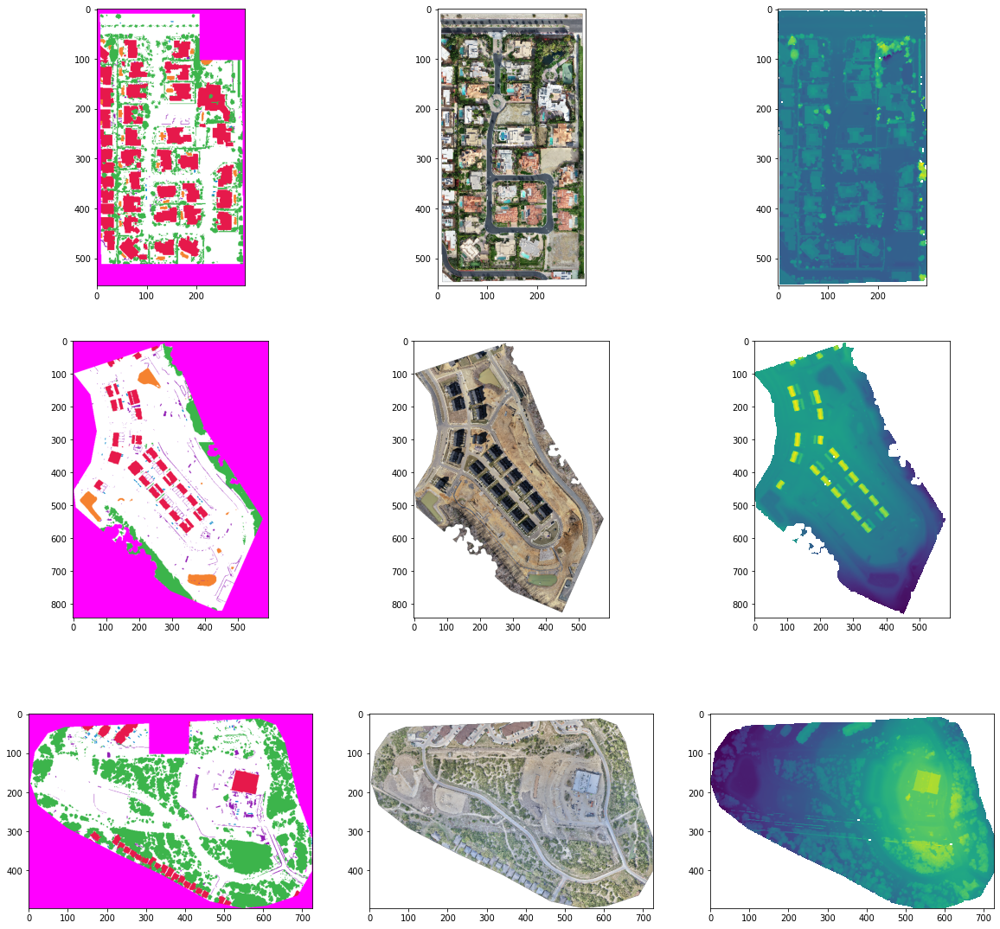

In [33]:
import tifffile, imageio
import numpy as np
from matplotlib import pyplot as plt

plt.rcParams['figure.figsize'] = [20, 20]

reduction = 10
subplot = 1

for index, row in imageInfo.iterrows():

  array_labelRGB = imageio.imread(row.path_labels)[::reduction,::reduction,:]
  array_orthoRGB = tifffile.imread(row.path_images)[::reduction,::reduction,:]
  array_elevation32 = tifffile.imread(row.path_elevation)[::reduction,::reduction]
  array_elevation32[array_elevation32==-32767.0] = np.nan
  # print(array_elevation32.min())

  plt.subplot(330+subplot)
  plt.imshow(array_labelRGB)
  subplot+=1

  plt.subplot(330+subplot)
  plt.imshow(array_orthoRGB)
  subplot+=1

  plt.subplot(330+subplot)
  plt.imshow(array_elevation32)
  subplot+=1


#Regression

In [0]:
def trainBlueModel(imageIndex):
  row = imageInfo.iloc[imageIndex]
  reduction =10
  array_orthoRGB = tifffile.imread(row.path_images)[::reduction,::reduction,:]

  from sklearn.ensemble import GradientBoostingRegressor

  X_train = array_orthoRGB[:,:,0:2]
  y_train = array_orthoRGB[:,:,2]

  X_train = X_train.reshape(-1, X_train.shape[-1])
  y_train = y_train.flatten()

  est = GradientBoostingRegressor(n_estimators=100, learning_rate=1,
                                  max_depth=1, random_state=0, loss='huber', verbose=1).fit(X_train, y_train)

  return est

In [151]:
blueModel = trainBlueModel(0)

      Iter       Train Loss   Remaining Time 
         1         789.2506            5.63s
         2         553.3944            5.73s
         3         474.8459            5.73s
         4         389.0326            5.84s
         5         335.8223            6.18s
         6         315.3083            6.05s
         7         287.7463            5.98s
         8         270.5969            5.90s
         9         259.9000            5.82s
        10         248.2140            5.74s
        20         206.0404            5.06s
        30         186.8531            4.45s
        40         177.4770            3.84s
        50         171.4034            3.21s
        60         166.4295            2.58s
        70         163.5838            1.95s
        80         161.4600            1.30s
        90         159.4733            0.65s
       100         158.2443            0.00s


In [0]:
def plotBlueModel(imageIndex, blueModel):

  row = imageInfo.iloc[imageIndex]
  reduction =10
  array_orthoRGB = tifffile.imread(row.path_images)[::reduction,::reduction,:]

  X_train = array_orthoRGB[:,:,0:2]
  X_train = X_train.reshape(-1, X_train.shape[-1])

  y_result = blueModel.predict(X_train)

  inshape = array_orthoRGB.shape
  y_result_array = y_result.reshape(inshape[0:2])
  plt.subplot(131)
  plt.imshow(array_orthoRGB[:,:,2])
  plt.subplot(132)
  plt.imshow(y_result_array)
  plt.subplot(133)
  plt.imshow(array_orthoRGB[:,:,2]-y_result_array)

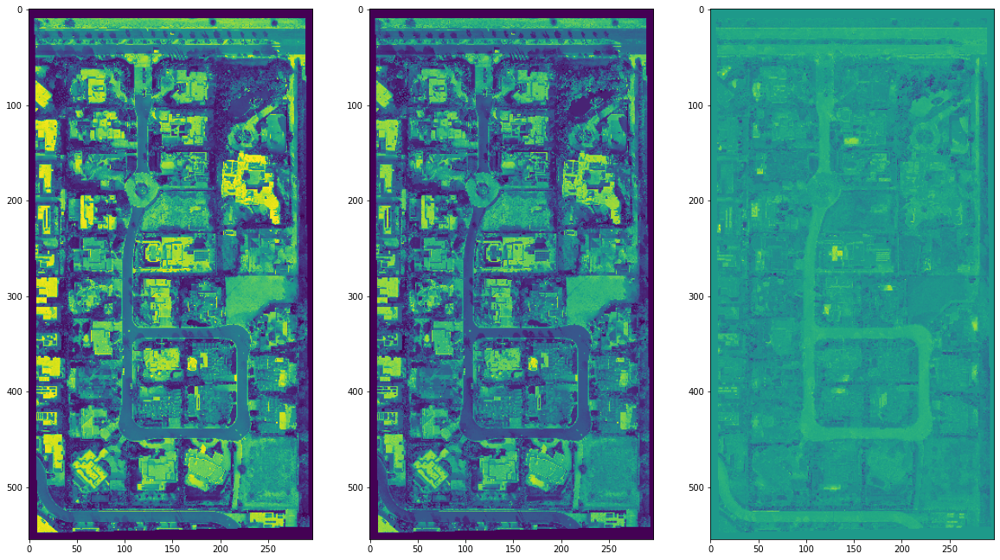

In [154]:
plotBlueModel(0, blueModel)

In [0]:
def plotBlueModel_RGB(imageIndex, blueModel):
  row = imageInfo.iloc[imageIndex]
  reduction =5
  array_orthoRGB = tifffile.imread(row.path_images)[::reduction,::reduction,:]

  X_train = array_orthoRGB[:,:,0:2]
  X_train = X_train.reshape(-1, X_train.shape[-1])

  y_result = blueModel.predict(X_train)

  inshape = array_orthoRGB.shape
  y_result_array = y_result.reshape(inshape[0:2])

  #############
  array_orthoRGB_model = array_orthoRGB.copy()
  array_orthoRGB_model[:,:,2] = y_result_array

  array_orthoRGB_noBlue = array_orthoRGB.copy() 
  array_orthoRGB_noBlue[:,:,2] = 0

  plt.subplot(131)
  plt.imshow(array_orthoRGB)
  plt.subplot(132)
  plt.imshow(array_orthoRGB_noBlue)
  plt.subplot(133)
  plt.imshow(array_orthoRGB_model)


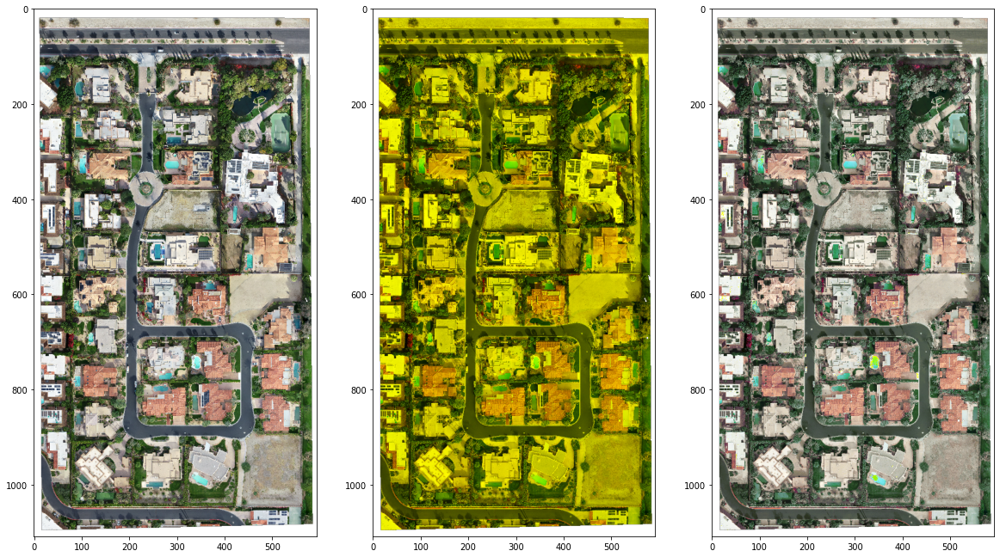

In [201]:
plotBlueModel_RGB(0,blueModel)

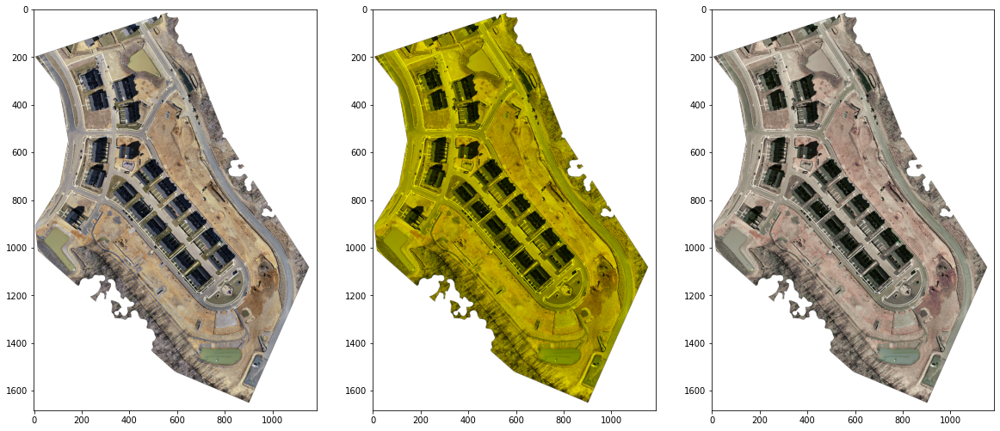

In [202]:
plotBlueModel_RGB(1,blueModel)

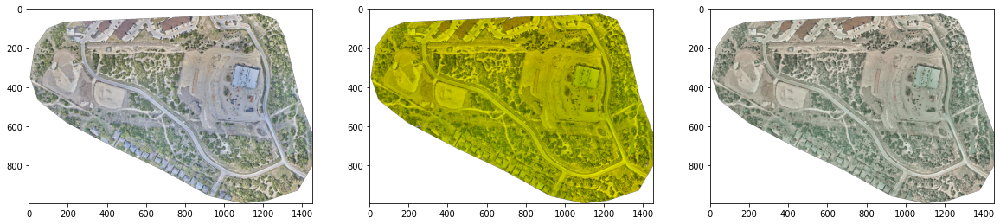

In [203]:
plotBlueModel_RGB(2, blueModel)

Lets Add in elevation

In [62]:
%cd /content
!git clone https://github.com/NSCC-COGS/GDAA2030.git

/content
Cloning into 'GDAA2030'...
remote: Enumerating objects: 31, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 401 (delta 10), reused 0 (delta 0), pack-reused 370
Receiving objects: 100% (401/401), 24.63 MiB | 34.70 MiB/s, done.
Resolving deltas: 100% (168/168), done.


In [76]:
%cd /content/GDAA2030/tutorial4/kevinkmcguigan
%ls

/content/GDAA2030/tutorial4/kevinkmcguigan
GDAA2030_T4_kevinmc.ipynb  README.md


In [0]:
%%capture
%run GDAA2030_T4_kevinmc.ipynb

In [81]:
%cd /content/dataset-sample/

/content/dataset-sample


In [0]:
def get_elevation8(imageIndex, reduction = 5):
  row = imageInfo.iloc[imageIndex]

  array_elevation32 = tifffile.imread(row.path_elevation)[::reduction,::reduction]
  # array_elevation32[array_elevation32==-32767.0] = np.nan

  array_elevation8 = convert32(array_elevation32, maskVal=-32767.0, inplace=False)
  array_elevation8 = stdScale(array_elevation8, n=.2, inplace=True) # note that I did play with the number of standard deviation here
  array_elevation8 = normalize(array_elevation8, inplace=True)
  array_elevation8,mask = scale8bit(array_elevation8, return_mask=True, inplace=True)
  return array_elevation8

Scale from 27.956630 to 80.017873


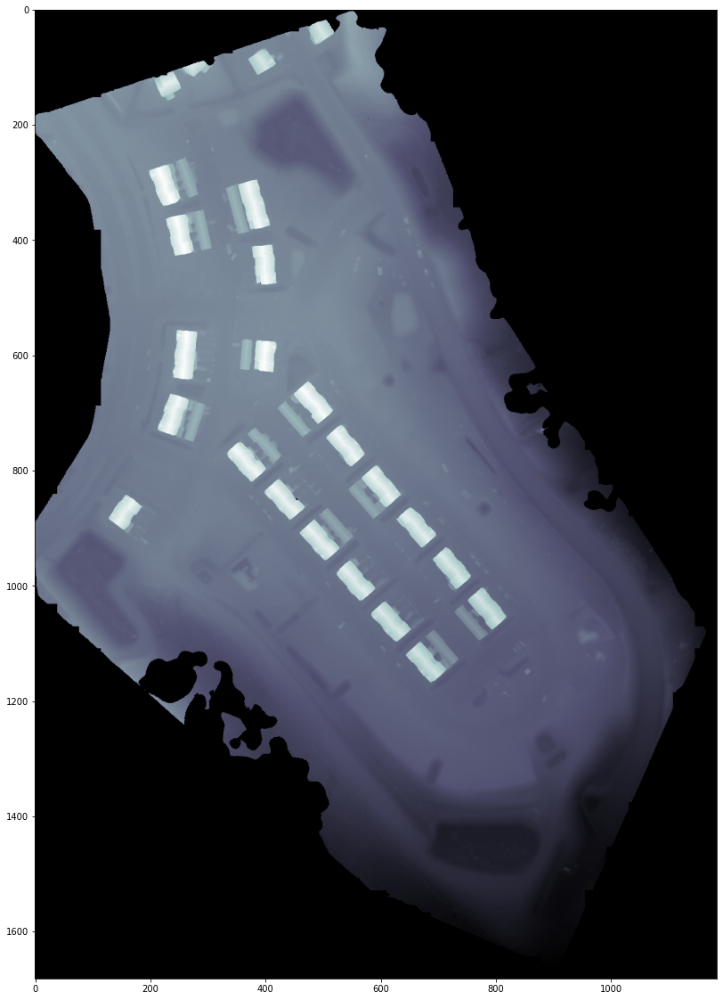

In [184]:
array_elevation8 = get_elevation8(1)
plt.imshow(array_elevation8, cmap='bone')


In [0]:
def trainBlueModel_elevation(imageIndex):
  row = imageInfo.iloc[imageIndex]
  reduction =10
  array_orthoRGB = tifffile.imread(row.path_images)[::reduction,::reduction,:]
  array_orthoRGB_elevation = array_orthoRGB.copy()
  array_orthoRGB_elevation[:,:,2] = get_elevation8(imageIndex, reduction=reduction)

  from sklearn.ensemble import GradientBoostingRegressor

  X_train = array_orthoRGB_elevation[:,:,0:3]
  y_train = array_orthoRGB[:,:,2]

  X_train = X_train.reshape(-1, X_train.shape[-1])
  y_train = y_train.flatten()

  est = GradientBoostingRegressor(n_estimators=100, learning_rate=1,
                                  max_depth=1, random_state=0, loss='huber', verbose=1).fit(X_train, y_train)
  return est

In [195]:
blueModel_elevation = trainBlueModel_elevation(1)

Scale from 27.957248 to 80.015568
      Iter       Train Loss   Remaining Time 
         1         315.3244           16.94s
         2         214.4886           17.12s
         3         192.1715           16.84s
         4         171.7323           16.63s
         5         151.6305           16.61s
         6         136.6001           16.53s
         7         127.3105           16.29s
         8         120.2539           16.15s
         9         114.7164           15.91s
        10         110.3156           15.76s
        20          77.8579           14.27s
        30          63.3229           12.51s
        40          55.5769           10.77s
        50          50.0854            9.00s
        60          45.8971            7.22s
        70          42.6131            5.44s
        80          39.9039            3.63s
        90          37.8395            1.82s
       100          36.1016            0.00s


In [0]:
def plotBlueModel_elevation_RGB(imageIndex, blueModel):
  row = imageInfo.iloc[imageIndex]
  reduction =5
  array_orthoRGB = tifffile.imread(row.path_images)[::reduction,::reduction,:]
  array_orthoRGB_elevation = array_orthoRGB.copy()
  array_orthoRGB_elevation[:,:,2] = get_elevation8(imageIndex, reduction=reduction)

  X_train = array_orthoRGB_elevation[:,:,0:3]
  X_train = X_train.reshape(-1, X_train.shape[-1])

  y_result = blueModel.predict(X_train)

  inshape = array_orthoRGB.shape
  y_result_array = y_result.reshape(inshape[0:2])

  #############
  array_orthoRGB_model = array_orthoRGB.copy()
  array_orthoRGB_model[:,:,2] = y_result_array

  plt.subplot(131)
  plt.imshow(array_orthoRGB)
  plt.subplot(132)
  plt.imshow(array_orthoRGB_elevation[:,:,2] )
  plt.subplot(133)
  plt.imshow(array_orthoRGB_model)

Scale from -10.093031 to 19.084084


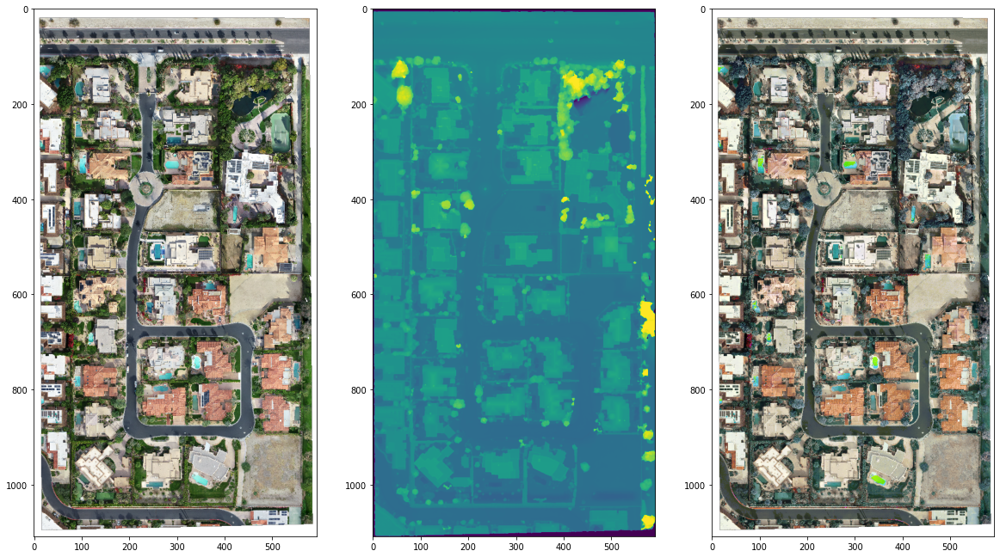

In [197]:
plotBlueModel_elevation_RGB(0, blueModel_elevation)

Scale from 27.956630 to 80.017873


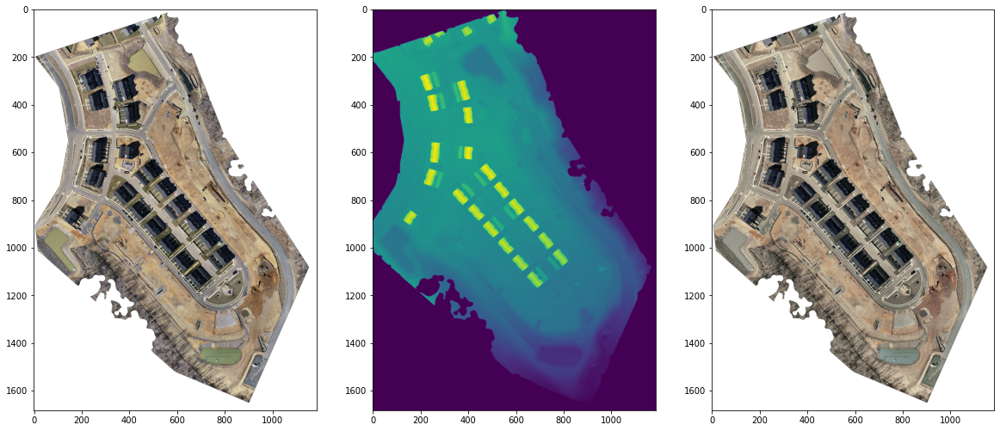

In [198]:
plotBlueModel_elevation_RGB(1, blueModel_elevation)

Scale from 193.706141 to 296.731787


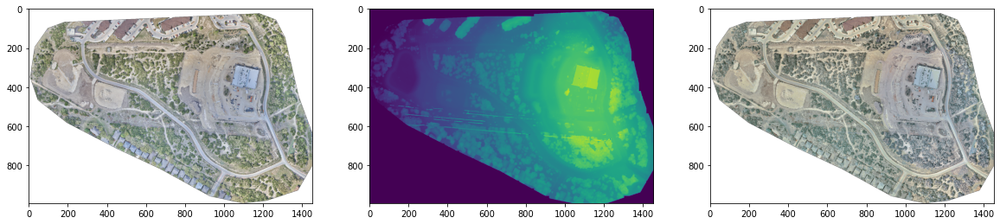

In [199]:
plotBlueModel_elevation_RGB(2, blueModel_elevation)

In [0]:
def get_elevation8_normalized(imageIndex, reduction = 5):
  row = imageInfo.iloc[imageIndex]

  array_elevation32 = tifffile.imread(row.path_elevation)[::reduction,::reduction]

  #### added this part... 
  array_elevation32[array_elevation32==-32767.0] = np.nan
  from astropy.convolution import convolve
  from astropy.convolution import Gaussian2DKernel
  kernel = Gaussian2DKernel(x_stddev=20)
  array_elevation32_norm = convolve(array_elevation32, kernel)
  array_elevation32_norm -= array_elevation32


  array_elevation8 = convert32(array_elevation32_norm, maskVal=-32767.0, inplace=False)
  array_elevation8 = stdScale(array_elevation8, n=.2, inplace=True) # note that I did play with the number of standard deviation here
  array_elevation8 = normalize(array_elevation8, inplace=True)
  array_elevation8,mask = scale8bit(array_elevation8, return_mask=True, inplace=True)
  return array_elevation8

Scale from -11.403465 to 11.050477


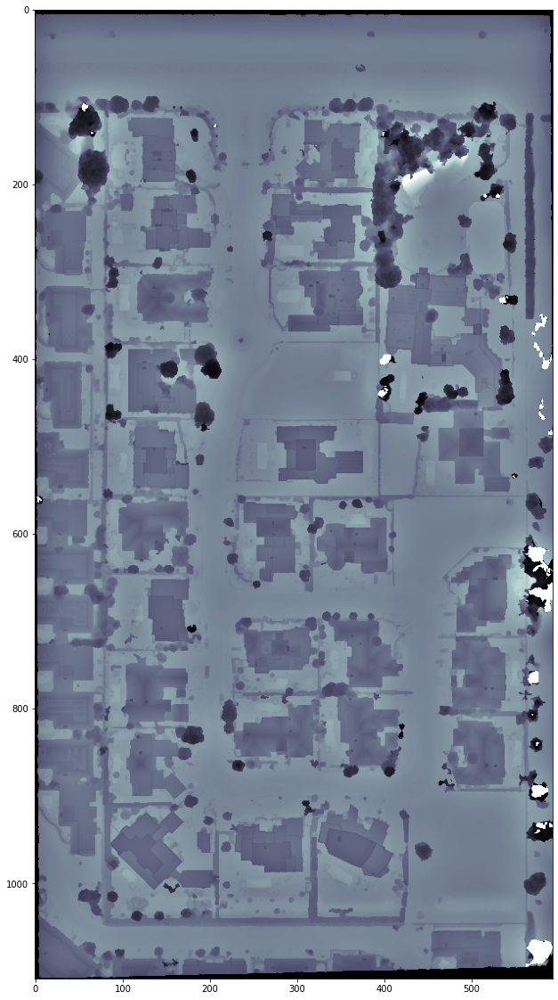

In [229]:
array_elevation8_norm = get_elevation8_normalized(0)
plt.imshow(array_elevation8_norm, cmap='bone')

Scale from -10.788898 to 10.567634


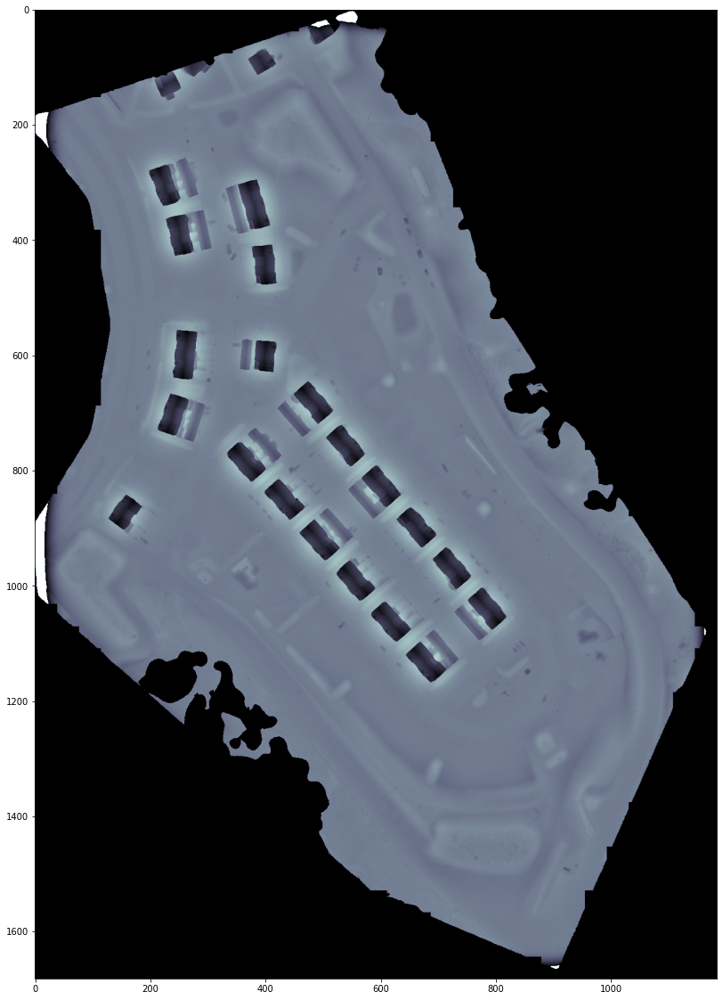

In [230]:
array_elevation8_norm = get_elevation8_normalized(1)
plt.imshow(array_elevation8_norm, cmap='bone')

Scale from -49.360171 to 46.281213


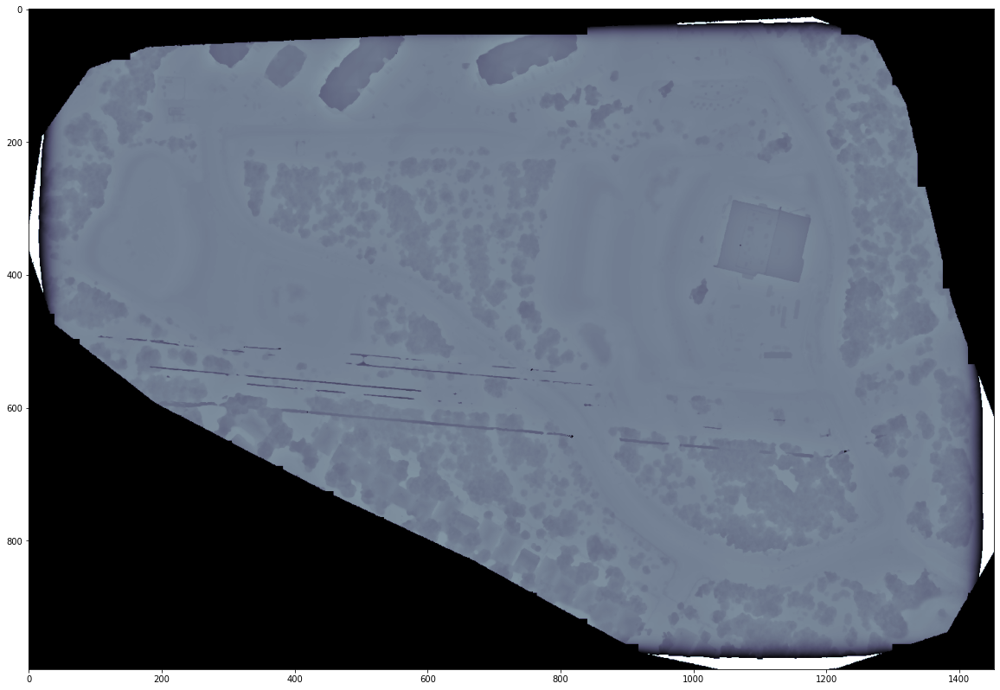

In [231]:
array_elevation8_norm = get_elevation8_normalized(2)
plt.imshow(array_elevation8_norm, cmap='bone')